In [136]:
# import necessary library
import pandas as pd
import math
import seaborn as sns
from matplotlib import pyplot as plt
import re
import numpy as np
import geopandas as gpd
from shapely.geometry import Point # Point class
from shapely.geometry import shape
import networkx as nx
import osmnx as ox
import os 
from geopandas import GeoDataFrame, read_file
from geopandas.tools import overlay
import shapely.geometry as geom
import shapely.wkt
from shapely.geometry import  Point, mapping
from itertools import combinations
import fiona

### Task 1: Read the Poisson Regression Model Annual Total traffic Data


### Task 2: Identify the intersection and aggregate the intersection total Annual Total traffic


### Task 3: Export the Intersection Volume file as GeoJSON file and share with Iman.

In [137]:
# read the Poisson Regression Model prediction AADBT file
predicted_traffic=gpd.read_file('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Modeling_Sep22,2023/Intersection_Volume_Aggregation_March19,2024/SHS_int_legs_volume_march20,2024.json')
predicted_traffic.head()

,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,AADBT,index,tdg_id,county,street_name,shs_status,...,log_Stv_adb,tdg_id_1,legs,int_counter_id,BUFF_DIST,ORIG_FID,geom_Length,geom_Area,Shape_Length,geometry
0,1,1,1,16793,37.335852,26192,133991,Tuolumne,Wilcox Ranch Road,XSTREET_SHS,...,-4.605170,79964,3.0,None,9.144018,16793,57.453561,262.678208,0.000069,"LINESTRING (-120.46216 37.99018, -120.46211 37..."
1,2,1,2,39138,45.022752,18973,106624,San Joaquin,SR-26-SAN JOAQUIN,SHS,...,-3.742338,61120,3.0,None,9.144018,39138,57.453561,262.678208,0.000093,"LINESTRING (-121.18545 37.99074, -121.18536 37..."
2,3,1,3,46831,138.990421,23858,139800,Orange,Dover Drive,XSTREET_SHS,...,2.560440,81696,4.0,None,9.144018,46831,57.453561,262.678208,0.000085,"LINESTRING (-117.90718 33.61633, -117.90719 33..."
3,4,1,4,35653,91.582629,11352,91499,San Bernardino,SR-38-SAN BERNARDINO,SHS,...,1.180676,53425,3.0,None,9.144018,35653,57.453561,262.678208,0.000165,"MULTILINESTRING ((-116.88886 34.17060, -116.88..."
4,5,1,4,35660,91.582629,11352,91499,San Bernardino,SR-38-SAN BERNARDINO,SHS,...,1.180676,53441,4.0,None,9.144018,35660,57.453561,262.678208,0.000165,"MULTILINESTRING ((-116.88886 34.17060, -116.88..."


In [138]:
predicted_traffic['AADBT'].describe()

count    78784.000000
mean        86.765642
std         62.294971
min         34.765383
25%         52.669535
50%         73.395079
75%        104.150001
max       4269.374185
Name: AADBT, dtype: float64

In [139]:
# Convert AADBT to Annual Total traffic. The above prediction is for 2019, as there was 365 days in 2029, we will multiple AADBT with 365 to obtain ATT
predicted_traffic['ATT']=predicted_traffic['AADBT']*365
predicted_traffic.head()

,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,AADBT,index,tdg_id,county,street_name,shs_status,...,tdg_id_1,legs,int_counter_id,BUFF_DIST,ORIG_FID,geom_Length,geom_Area,Shape_Length,geometry,ATT
0,1,1,1,16793,37.335852,26192,133991,Tuolumne,Wilcox Ranch Road,XSTREET_SHS,...,79964,3.0,None,9.144018,16793,57.453561,262.678208,0.000069,"LINESTRING (-120.46216 37.99018, -120.46211 37...",13627.586047
1,2,1,2,39138,45.022752,18973,106624,San Joaquin,SR-26-SAN JOAQUIN,SHS,...,61120,3.0,None,9.144018,39138,57.453561,262.678208,0.000093,"LINESTRING (-121.18545 37.99074, -121.18536 37...",16433.304654
2,3,1,3,46831,138.990421,23858,139800,Orange,Dover Drive,XSTREET_SHS,...,81696,4.0,None,9.144018,46831,57.453561,262.678208,0.000085,"LINESTRING (-117.90718 33.61633, -117.90719 33...",50731.503579
3,4,1,4,35653,91.582629,11352,91499,San Bernardino,SR-38-SAN BERNARDINO,SHS,...,53425,3.0,None,9.144018,35653,57.453561,262.678208,0.000165,"MULTILINESTRING ((-116.88886 34.17060, -116.88...",33427.659659
4,5,1,4,35660,91.582629,11352,91499,San Bernardino,SR-38-SAN BERNARDINO,SHS,...,53441,4.0,None,9.144018,35660,57.453561,262.678208,0.000165,"MULTILINESTRING ((-116.88886 34.17060, -116.88...",33427.659659


In [140]:
predicted_traffic.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [141]:
# Lets do the projection
predicted_traffic = predicted_traffic.set_crs("EPSG:4326")
predicted_traffic_proj = predicted_traffic.to_crs(epsg=32610)
predicted_traffic_proj.head()

,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,AADBT,index,tdg_id,county,street_name,shs_status,...,tdg_id_1,legs,int_counter_id,BUFF_DIST,ORIG_FID,geom_Length,geom_Area,Shape_Length,geometry,ATT
0,1,1,1,16793,37.335852,26192,133991,Tuolumne,Wilcox Ranch Road,XSTREET_SHS,...,79964,3.0,None,9.144018,16793,57.453561,262.678208,0.000069,"LINESTRING (722862.836 4207764.871, 722867.976...",13627.586047
1,2,1,2,39138,45.022752,18973,106624,San Joaquin,SR-26-SAN JOAQUIN,SHS,...,61120,3.0,None,9.144018,39138,57.453561,262.678208,0.000093,"LINESTRING (659339.297 4206341.288, 659347.121...",16433.304654
2,3,1,3,46831,138.990421,23858,139800,Orange,Dover Drive,XSTREET_SHS,...,81696,4.0,None,9.144018,46831,57.453561,262.678208,0.000085,"LINESTRING (972657.185 3731264.984, 972656.839...",50731.503579
3,4,1,4,35653,91.582629,11352,91499,San Bernardino,SR-38-SAN BERNARDINO,SHS,...,53425,3.0,None,9.144018,35653,57.453561,262.678208,0.000165,"MULTILINESTRING ((1063616.001 3797992.951, 106...",33427.659659
4,5,1,4,35660,91.582629,11352,91499,San Bernardino,SR-38-SAN BERNARDINO,SHS,...,53441,4.0,None,9.144018,35660,57.453561,262.678208,0.000165,"MULTILINESTRING ((1063616.001 3797992.951, 106...",33427.659659


In [142]:
# Delete some of the legs based on manual checking and observation
predicted_traffic_proj1=predicted_traffic_proj.loc[predicted_traffic_proj['tdg_id']!=45961]
predicted_traffic_proj1=predicted_traffic_proj1.loc[predicted_traffic_proj1['tdg_id']!=45953]
predicted_traffic_proj1=predicted_traffic_proj1.loc[predicted_traffic_proj1['tdg_id']!=131040]
predicted_traffic_proj1=predicted_traffic_proj1.loc[predicted_traffic_proj1['tdg_id']!=	103773]
predicted_traffic_proj1=predicted_traffic_proj1.loc[predicted_traffic_proj1['tdg_id']!=21720]
predicted_traffic_proj1=predicted_traffic_proj1.loc[predicted_traffic_proj1['tdg_id_1']!=27538]
# update the legs number
predicted_traffic_proj1.loc[predicted_traffic_proj1['tdg_id_1']==14561,'legs']=5
predicted_traffic_proj1.loc[predicted_traffic_proj1['tdg_id_1']==27538,'legs']=4
predicted_traffic_proj1.loc[predicted_traffic_proj1['tdg_id_1']==24759,'legs']=4
predicted_traffic_proj1.loc[predicted_traffic_proj1['tdg_id_1']==24759,'legs']=4
predicted_traffic_proj1.loc[predicted_traffic_proj1['tdg_id_1']==59546,'legs']=6
predicted_traffic_proj1.loc[predicted_traffic_proj1['tdg_id_1']==78097,'legs']=5

In [143]:
predicted_traffic_proj2=predicted_traffic_proj1.rename(columns={'tdg_id_1':'int_tdg_id'})
predicted_traffic_proj2['int_tdg_id'].nunique()

31385

In [144]:
predicted_traffic_proj.columns

Index(['OBJECTID', 'Join_Count', 'TARGET_FID', 'JOIN_FID', 'AADBT', 'index',
       'tdg_id', 'county', 'street_name', 'shs_status', 'Length', 'class',
       'Stv_adb', 'empnum_density_t', 'exist_bike_parking_q',
       'Intersection_density5', 'pctnoveh_h', 'pctbiketowork_h', 'urban',
       'Yolo', 'log_Stv_adb', 'tdg_id_1', 'legs', 'int_counter_id',
       'BUFF_DIST', 'ORIG_FID', 'geom_Length', 'geom_Area', 'Shape_Length',
       'geometry', 'ATT'],
      dtype='object')

In [145]:
# Check for the intersection, how many legss we have, it seems that this intersection has three legs orginally and however, we predicted volume for 2 legs
check=predicted_traffic_proj2.loc[predicted_traffic_proj2['int_tdg_id']== 78097]
check

,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,AADBT,index,tdg_id,county,street_name,shs_status,...,int_tdg_id,legs,int_counter_id,BUFF_DIST,ORIG_FID,geom_Length,geom_Area,Shape_Length,geometry,ATT
38632,38633,1,23770,46247,54.231929,36472,131123,Tulare,Avenue 328,XSTREET_SHS,...,78097,5.0,None,9.144018,46247,57.453561,262.678208,0.000096,"LINESTRING (839477.354 4033300.129, 839485.877...",19794.654195
38903,38904,1,23942,46247,54.235002,44567,132366,Tulare,Millwood Drive,XSTREET_SHS,...,78097,5.0,None,9.144018,46247,57.453561,262.678208,0.000164,"MULTILINESTRING ((839493.312 4033301.463, 8395...",19795.775840
39558,39559,1,24334,46247,47.747118,34340,131265,Tulare,Depot Drive,XSTREET_SHS,...,78097,5.0,None,9.144018,46247,57.453561,262.678208,0.000094,"LINESTRING (839485.877 4033298.712, 839480.295...",17427.698084
47499,47500,1,29200,46247,65.291022,36488,131132,Tulare,Road 160,SHS,...,78097,5.0,None,9.144018,46247,57.453561,262.678208,0.000157,"MULTILINESTRING ((839488.336 4033291.170, 8394...",23831.223045
56926,56927,1,34994,46247,57.484750,43075,133008,Tulare,Road 160,XSTREET_SHS,...,78097,5.0,None,9.144018,46247,57.453561,262.678208,0.000089,"LINESTRING (839485.877 4033298.712, 839483.959...",20981.933927


In [147]:
# We will sum the volume by intersection leg id, also keep records the number of orginal legs in that particular intersection and also how many legs volume we determined
# lets do it step by step
inter_vol=predicted_traffic_proj2.groupby(['int_tdg_id','legs'])['ATT'].sum().reset_index()
inter_vol=inter_vol.rename(columns={'ATT': 'Total_Annual_Traffic'})
inter_leg_freq=predicted_traffic_proj2.groupby(['int_tdg_id'])['ATT'].count().reset_index()
inter_leg_freq=inter_leg_freq.rename(columns={'ATT': 'Estimated_Number_of_Legs'})
inter_vol1=pd.merge(inter_vol, inter_leg_freq, on=['int_tdg_id'], how='inner')
inter_vol1.head()

,int_tdg_id,legs,Total_Annual_Traffic,Estimated_Number_of_Legs
0,3,3.0,111176.666210,3
1,4,3.0,108565.227905,3
2,5,3.0,105012.378293,3
3,6,3.0,110924.433409,3
4,7,4.0,133322.422253,4


In [148]:
inter_vol1.shape

(31311, 4)

In [149]:
# Lets identify the four legs only for the study
inter_vol1['leg_diff']=inter_vol1['legs']-inter_vol1['Estimated_Number_of_Legs']
inter_vol2=inter_vol1.loc[inter_vol1['leg_diff']==0]
inter_vol2.shape

(18336, 5)

In [150]:
inter_vol2['int_tdg_id'].nunique()

18336

In [151]:
inter_vol2.head()

,int_tdg_id,legs,Total_Annual_Traffic,Estimated_Number_of_Legs,leg_diff
0,3,3.0,111176.666210,3,0.0
1,4,3.0,108565.227905,3,0.0
2,5,3.0,105012.378293,3,0.0
3,6,3.0,110924.433409,3,0.0
4,7,4.0,133322.422253,4,0.0


In [152]:
print('intersection that have complete data:',inter_vol2.groupby(['legs'])['int_tdg_id'].count())

intersection that have complete data: legs
3.0    13640
4.0     4632
5.0       58
6.0        6
Name: int_tdg_id, dtype: int64


In [153]:
# lets check what kind of intersection we missed
# miss_int=inter_vol1.loc[inter_vol1['leg_diff']!=0]
# print('intersection that have incomplete data:',miss_int.groupby(['legs'])['legs'].count())

In [154]:
# Lets add the intersection geometry from the PSIP 3 project
statewide_int=gpd.read_file('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Modeling_Sep22,2023/Intersection_Volume_Aggregation_March19,2024/statewide_intersection.json')
statewide_int=statewide_int.drop(['fid','legs','int_counter_id'],axis=1)
statewide_int.head()

,tdg_id,geometry
0,3,MULTIPOINT (765744.119 4293629.821)
1,4,MULTIPOINT (776122.196 4297178.916)
2,5,MULTIPOINT (775661.156 4296496.979)
3,6,MULTIPOINT (767664.885 4296469.727)
4,7,MULTIPOINT (775931.141 4296670.074)


In [155]:
# Lets add the geometry with the selected intersections within the highway
inter_vol3=pd.merge(statewide_int,inter_vol2, left_on=['tdg_id'],right_on=['int_tdg_id'], how='inner')
inter_vol3.head()

,tdg_id,geometry,int_tdg_id,legs,Total_Annual_Traffic,Estimated_Number_of_Legs,leg_diff
0,3,MULTIPOINT (765744.119 4293629.821),3,3.0,111176.666210,3,0.0
1,4,MULTIPOINT (776122.196 4297178.916),4,3.0,108565.227905,3,0.0
2,5,MULTIPOINT (775661.156 4296496.979),5,3.0,105012.378293,3,0.0
3,6,MULTIPOINT (767664.885 4296469.727),6,3.0,110924.433409,3,0.0
4,7,MULTIPOINT (775931.141 4296670.074),7,4.0,133322.422253,4,0.0


In [156]:
# Do the manual investigation of the intersection that have more than 5 legs
mlegs=inter_vol3.loc[inter_vol3['legs']>5]
mlegs
# Thses are all good intersection

,tdg_id,geometry,int_tdg_id,legs,Total_Annual_Traffic,Estimated_Number_of_Legs,leg_diff
1817,6988,MULTIPOINT (750236.312 4025479.602),6988,6.0,8.041148e+04,6,0.0
1971,7630,MULTIPOINT (755010.760 4030510.058),7630,6.0,7.613619e+04,6,0.0
1972,7631,MULTIPOINT (756572.330 4032180.355),7631,6.0,7.613619e+04,6,0.0
7497,25838,MULTIPOINT (927172.102 3753416.797),25838,6.0,2.315669e+05,6,0.0
13650,59546,MULTIPOINT (551205.052 4180793.649),59546,6.0,1.269624e+06,6,0.0
14567,66376,MULTIPOINT (557813.141 4158879.146),66376,6.0,2.229082e+05,6,0.0


#This site has 6 unique branch, so we will not delete or edit anyone [int_tdg_id=6988]
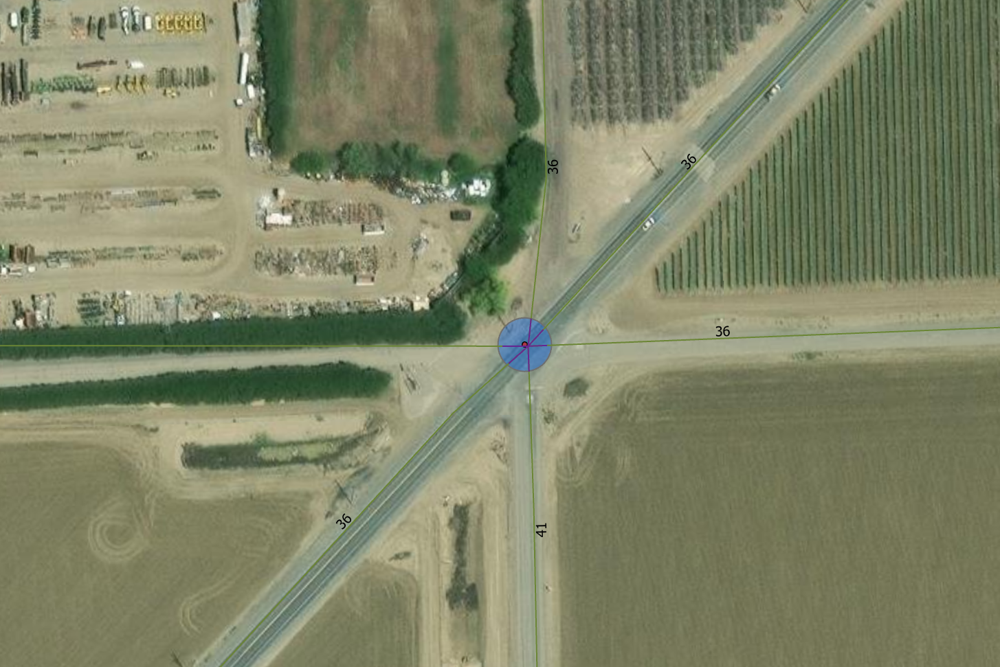
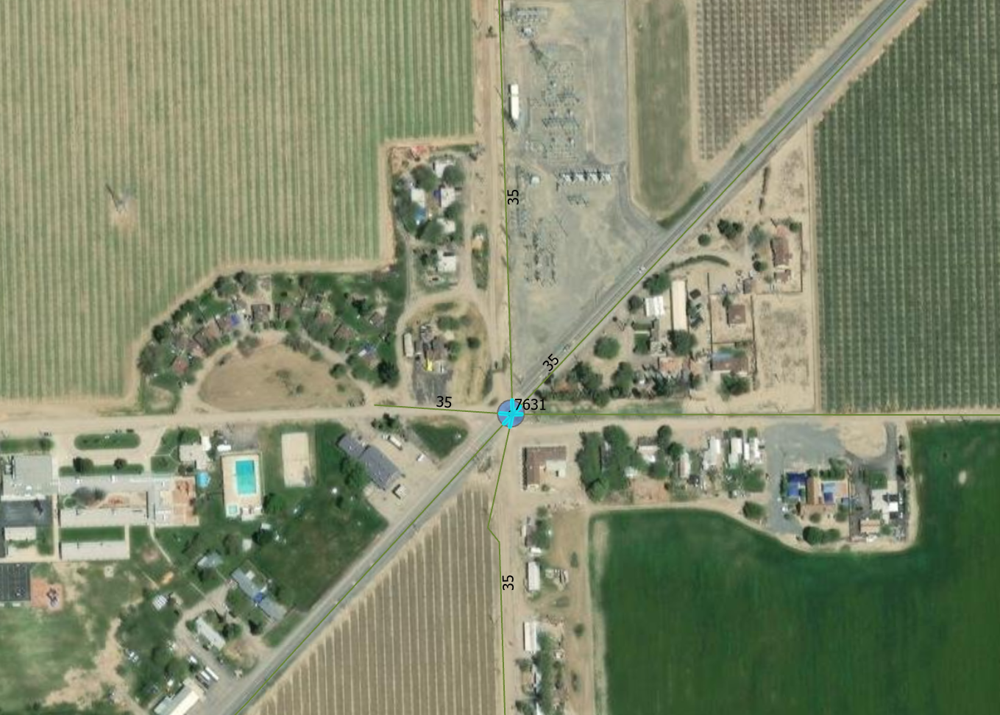

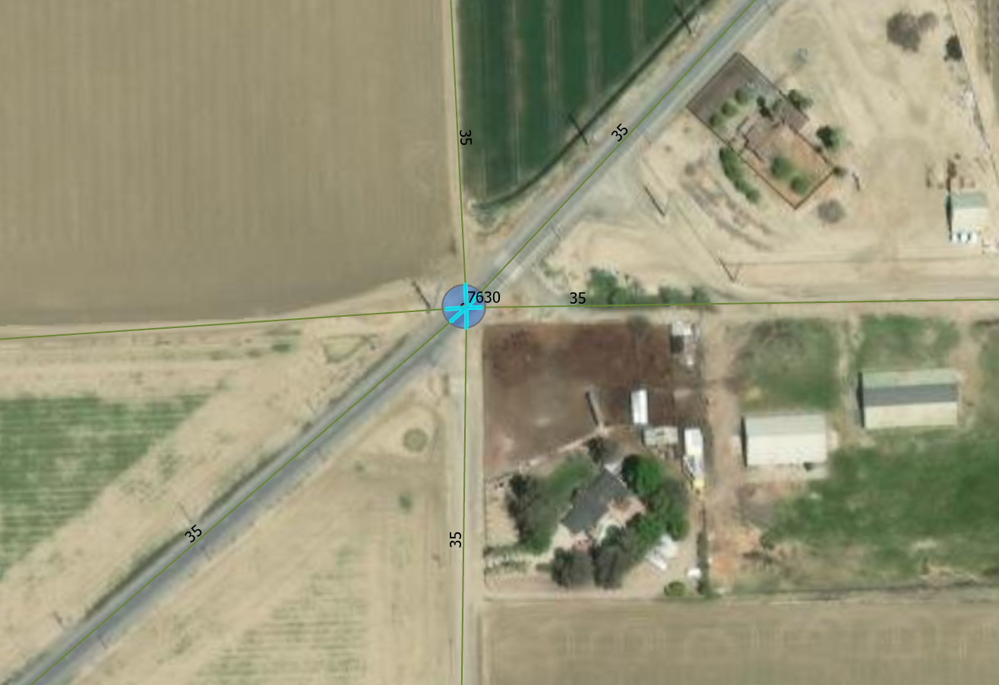

# we will delete one leg from the be
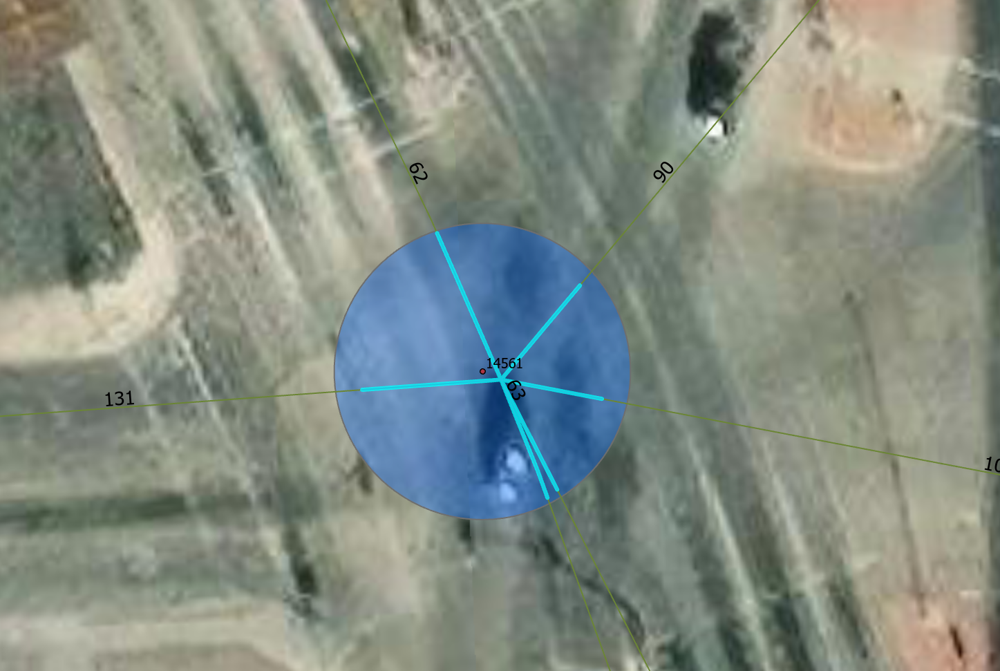

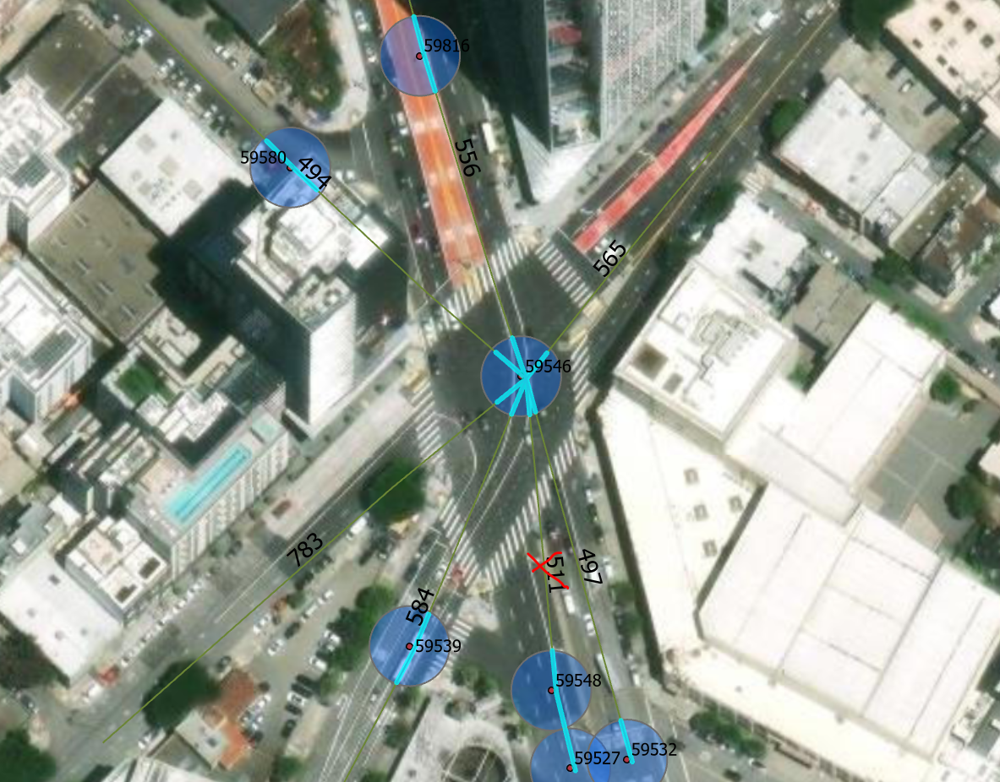

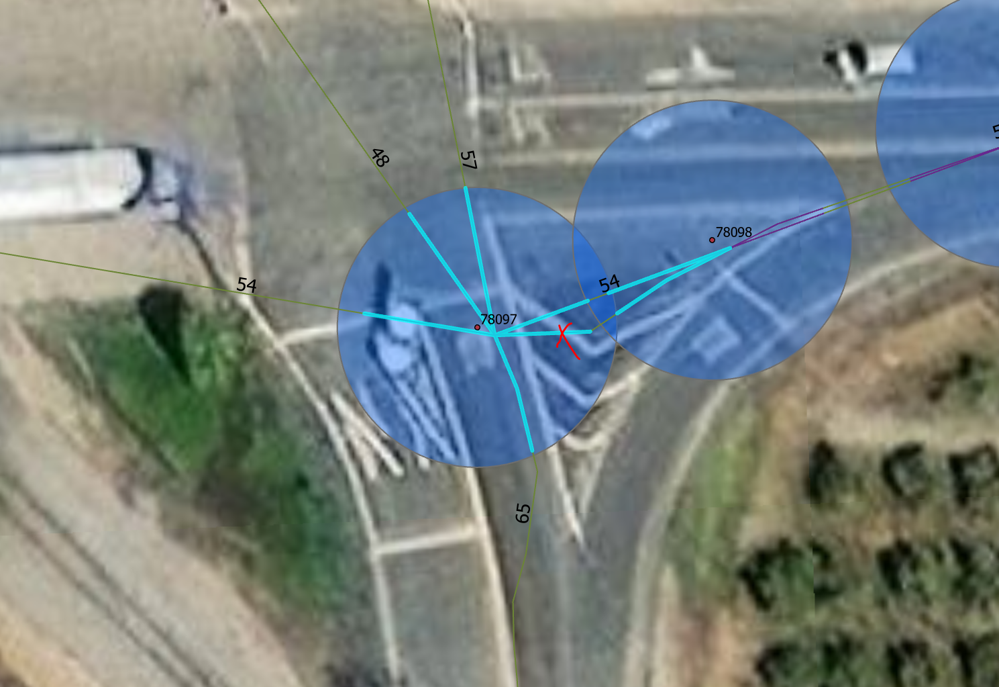

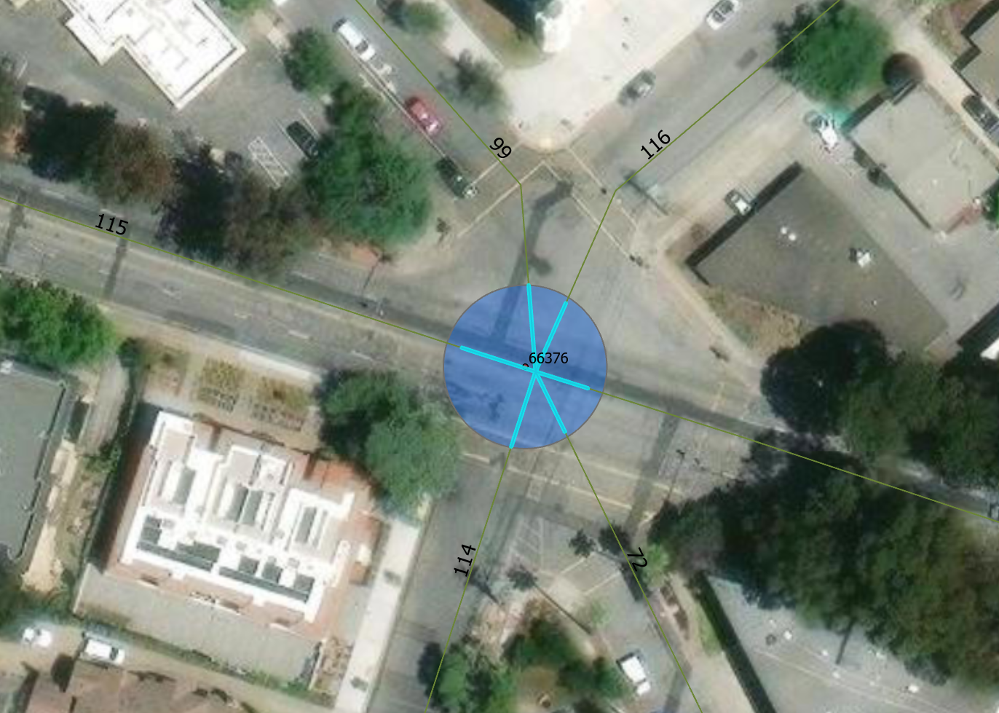

In [ ]:
# If we had angle information like for 4 leg intersection angle will be =90, for 3-leg intersection, angle=120, 2 leg intersection, angle=180


In [112]:
# Lets write a function to apply some simple algebric factor
# def int_vol(Total_Annual_Traffic,legs):
#     if legs==7:
#         return Total_Annual_Traffic/3.5
#     if legs==6:
#         return Total_Annual_Traffic/3.0
#     elif legs==5:
#         return Total_Annual_Traffic/2.5
#     elif legs==4:
#         return Total_Annual_Traffic/2.0
#     elif legs==3:
#         return Total_Annual_Traffic/1.5
#     else:
#         return Total_Annual_Traffic
    

In [157]:
# Apply this function to get final intersection total volume
inter_vol3['Int_Traffic_vol']=inter_vol3['Total_Annual_Traffic']/2
inter_vol3.head()

,tdg_id,geometry,int_tdg_id,legs,Total_Annual_Traffic,Estimated_Number_of_Legs,leg_diff,Int_Traffic_vol
0,3,MULTIPOINT (765744.119 4293629.821),3,3.0,111176.666210,3,0.0,55588.333105
1,4,MULTIPOINT (776122.196 4297178.916),4,3.0,108565.227905,3,0.0,54282.613953
2,5,MULTIPOINT (775661.156 4296496.979),5,3.0,105012.378293,3,0.0,52506.189146
3,6,MULTIPOINT (767664.885 4296469.727),6,3.0,110924.433409,3,0.0,55462.216705
4,7,MULTIPOINT (775931.141 4296670.074),7,4.0,133322.422253,4,0.0,66661.211126


In [158]:
inter_vol3.shape

(18336, 8)

In [159]:
inter_vol3.crs

<Derived Projected CRS: EPSG:26910>
Name: NAD83 / UTM zone 10N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: North America - between 126°W and 120°W - onshore and offshore. Canada - British Columbia; Northwest Territories; Yukon. United States (USA) - California; Oregon; Washington.
- bounds: (-126.0, 30.54, -119.99, 81.8)
Coordinate Operation:
- name: UTM zone 10N
- method: Transverse Mercator
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [160]:
# Now save the intersection volume file
#inter_vol3 = inter_vol2.set_crs("EPSG:32610")
#inter_vol2_save=inter_vol2.to_crs(epsg=4326)
crs = {'init': 'epsg:26910'}
shs_intersection_vol= gpd.GeoDataFrame(inter_vol3, crs=crs, geometry = 'geometry')
shs_intersection_vol.to_file('C:/UC Berkeley Project Backup/Bike_ped Exposure Model Project/Modeling_Sep22,2023/Intersection_Volume_Aggregation_March19,2024/SHS_intersection_total_bike_exposure_march20,2024.json', driver="GeoJSON")

C:\Users\Md Mintu Miah\anaconda3\envs\geo_env\lib\site-packages\pyproj\crs\crs.py:130: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


# End of the script